In [1]:
import pandas as pd
from itertools import combinations
import math
import numpy as np
import statistics
from itertools import permutations
from bioinfokit import analys, visuz
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from matplotlib_venn import venn2
import copy
import random
from vst_function import *
from stattools.resampling import PermutationTest

In [2]:
#pd.set_option('display.max_rows', 400)
data = pd.read_csv("../data/cnvnator_cnvs.csv")


anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

distribution = data[data['Lenght'] < 200000]
data

,Sample_ID,Chromosome,Start,End,CNV_value,Type,RD,Lenght,T-TEST-EVAL,GAUSSIAN-EVAL
0,LP6005441-DNA_A01,1,231001,237900,3.0,duplication,2.089230,6900.0,0.000000e+00,5.215800e-35
1,LP6005441-DNA_A01,1,471201,551200,1.0,deletion,0.187758,80000.0,1.992160e-12,2.215930e+09
2,LP6005441-DNA_A01,1,723801,728100,3.0,duplication,1.594500,4300.0,1.120070e-02,1.742820e+09
3,LP6005441-DNA_A01,1,1010901,1014200,1.0,deletion,0.498249,3300.0,5.434590e-04,2.196950e+09
4,LP6005441-DNA_A01,1,4124201,4127700,1.0,deletion,0.505571,3500.0,4.553500e-11,2.217790e-35
...,...,...,...,...,...,...,...,...,...,...
229336,SS6004480,X,153459601,153466400,3.0,duplication,1.882080,6800.0,3.234320e-09,7.076210e+01
229337,SS6004480,X,153474401,153496200,3.0,duplication,1.734000,21800.0,0.000000e+00,2.123580e+09
229338,SS6004480,X,153498901,153518500,3.0,duplication,1.886020,19600.0,0.000000e+00,2.117350e+07
229339,SS6004480,X,154798801,154804000,1.0,deletion,0.315173,5200.0,3.064860e-11,2.713240e+05


In [3]:
## Filter by chromosomes
data_x = distribution[distribution.Chromosome == 'X']
data_no_sex_chr = distribution[distribution.Chromosome != 'Y']
data = data_no_sex_chr[data_no_sex_chr.Chromosome != 'X']

data

,Sample_ID,Chromosome,Start,End,CNV_value,Type,RD,Lenght,T-TEST-EVAL,GAUSSIAN-EVAL
0,LP6005441-DNA_A01,1,231001,237900,3.0,duplication,2.089230,6900.0,0.000000e+00,5.215800e-35
1,LP6005441-DNA_A01,1,471201,551200,1.0,deletion,0.187758,80000.0,1.992160e-12,2.215930e+09
2,LP6005441-DNA_A01,1,723801,728100,3.0,duplication,1.594500,4300.0,1.120070e-02,1.742820e+09
3,LP6005441-DNA_A01,1,1010901,1014200,1.0,deletion,0.498249,3300.0,5.434590e-04,2.196950e+09
4,LP6005441-DNA_A01,1,4124201,4127700,1.0,deletion,0.505571,3500.0,4.553500e-11,2.217790e-35
...,...,...,...,...,...,...,...,...,...,...
229289,SS6004480,9,136624701,136626300,1.0,deletion,0.519522,1600.0,1.696790e-02,3.608230e+03
229290,SS6004480,9,138214101,138217600,1.0,deletion,0.525251,3500.0,4.553500e-11,1.258500e-18
229291,SS6004480,9,138479101,138480200,1.0,deletion,0.000000,1100.0,1.448840e-10,4.148920e-61
229292,SS6004480,9,140061701,140064400,1.0,deletion,0.212343,2700.0,1.475670e-09,1.241640e+00


In [ ]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
#plt.savefig('../plots/distribution.png', transparent=True)
plt.show()

In [4]:
cnv = data.pivot_table(index=["Chromosome", "Start", "End", "Type"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()
cnv#.loc[cnv['Chr'] == '8']




Sample_ID,Chromosome,Start,End,Type,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,...,SS6004471,SS6004472,SS6004473,SS6004474,SS6004475,SS6004476,SS6004477,SS6004478,SS6004479,SS6004480
0,1,176101,230900,deletion,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,176201,230100,deletion,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,176901,230500,deletion,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,177001,230500,deletion,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,177101,230500,deletion,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100849,9,140411501,140416500,duplication,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100850,9,140429601,140432800,deletion,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100851,9,140473301,140484500,duplication,NaN,NaN,NaN,NaN,NaN,NaN,...,1.46650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100852,9,140918301,141021000,duplication,NaN,NaN,NaN,NaN,NaN,NaN,...,1.49967,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
coordinates = cnv.iloc[:,0:2]
cnvs = cnv.iloc[:,4:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,100844,100845,100846,100847,100848,100849,100850,100851,100852,100853
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.00000,2.0,2.00000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A03,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.00000,2.0,2.00000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A04,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.00000,2.0,2.00000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A05,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.00000,2.0,2.00000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.00000,2.0,2.00000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.25713,2.0,2.00000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004477,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.00000,2.0,2.00000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.00000,2.0,2.30033,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [6]:
features = anotation.loc[:,["7-Gender","10-Region", "11-Country",]]
dt = features.merge(cnvs, left_index=True, right_index=True)
dt


,7-Gender,10-Region,11-Country,0,1,2,3,4,5,6,...,100844,100845,100846,100847,100848,100849,100850,100851,100852,100853
LP6005443-DNA_B06,F,WestEurasia,Iceland,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000
LP6005442-DNA_D08,F,WestEurasia,Iceland,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000
LP6005441-DNA_D07,F,SouthAsia,Pakistan,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000
LP6005441-DNA_C07,M,SouthAsia,Pakistan,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000
LP6005442-DNA_G11,M,Africa,SierraLeone,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,0.49261,2.0,2.0,2.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H10,F,WestEurasia,Russia,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000
LP6005519-DNA_A06,M,EastAsia,Myanmar,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000
LP6005519-DNA_B06,M,EastAsia,Myanmar,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000
LP6005441-DNA_B08,F,Africa,Congo,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.00000,2.0,2.0,2.00000


In [7]:
####### Groupby regions #######
dt_group = dt.groupby('10-Region')

dt_groupped = []
regions = anotation['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

In [8]:

dt_groupped

[                  7-Gender    10-Region      11-Country    0         1    2  \
 LP6005443-DNA_B06        F  WestEurasia         Iceland  2.0  2.000000  2.0   
 LP6005442-DNA_D08        F  WestEurasia         Iceland  2.0  2.000000  2.0   
 LP6005442-DNA_C02        M  WestEurasia        Abkhazia  2.0  2.000000  2.0   
 LP6005442-DNA_D02        M  WestEurasia          Russia  2.0  2.000000  2.0   
 LP6005442-DNA_F04        M  WestEurasia          Jordan  2.0  0.041386  2.0   
 ...                    ...          ...             ...  ...       ...  ...   
 LP6005443-DNA_A06        M  WestEurasia          Greece  2.0  2.000000  2.0   
 LP6005441-DNA_H12        F  WestEurasia  Italy(Tuscany)  2.0  2.000000  2.0   
 LP6005441-DNA_G10        M  WestEurasia          Russia  2.0  2.000000  2.0   
 LP6005441-DNA_H10        F  WestEurasia          Russia  2.0  2.000000  2.0   
 LP6005592-DNA_G01        M  WestEurasia           Yemen  2.0  2.000000  2.0   
 
                      3    4    5    6

In [9]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt


/Users/luciabazan/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var 

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, i

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:33: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  vt = pd.concat([x,y]).var()
/Users/luciabazan/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)
/Users/luciabazan/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3713: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, i

,0,1,2,3,4,5,6,7,8,9,...,100844,100845,100846,100847,100848,100849,100850,100851,100852,100853
WestEurasia-SouthAsia,NaN,0.013514,NaN,NaN,0.013514,0.013514,0.013514,NaN,0.025641,0.013514,...,NaN,0.018119,NaN,NaN,NaN,0.013514,NaN,NaN,NaN,0.013514
WestEurasia-Africa,NaN,0.013514,NaN,NaN,0.013514,0.013514,0.013514,NaN,NaN,0.013514,...,NaN,0.018485,NaN,NaN,NaN,0.013514,0.022727,0.022727,0.022727,0.013514
WestEurasia-CentralAsiaSiberia,NaN,0.013514,NaN,NaN,0.013514,0.013514,0.013514,NaN,NaN,0.013514,...,NaN,0.017088,NaN,NaN,NaN,0.013514,NaN,NaN,NaN,0.013514
WestEurasia-Oceania,NaN,0.013514,NaN,NaN,0.017496,0.013514,0.013514,NaN,NaN,0.013514,...,NaN,0.016790,0.041667,NaN,0.041667,0.013514,NaN,NaN,NaN,0.013514
WestEurasia-America,NaN,0.013514,0.045455,NaN,0.013514,0.013514,0.013514,0.045455,NaN,0.013514,...,0.045455,0.016581,NaN,NaN,NaN,0.013514,NaN,NaN,NaN,0.013514
WestEurasia-EastAsia,0.021739,0.013514,NaN,0.021739,0.013514,0.013514,0.013514,NaN,NaN,0.009328,...,NaN,0.018623,NaN,0.021739,NaN,0.013514,NaN,NaN,NaN,0.013514
SouthAsia-Africa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.025641,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.022727,0.022727,0.022727,NaN
SouthAsia-CentralAsiaSiberia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.025641,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SouthAsia-Oceania,NaN,NaN,NaN,NaN,0.041667,NaN,NaN,NaN,0.025641,NaN,...,NaN,NaN,0.041667,NaN,0.041667,NaN,NaN,NaN,NaN,NaN
SouthAsia-America,NaN,NaN,0.045455,NaN,NaN,NaN,NaN,0.045455,0.025641,NaN,...,0.045455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,637,765,1154,1173,1292,1402,1632,1666,1746,1868,...,100141,100378,100415,100561,100637,100696,100727,100742,100783,100833
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,True,False,False,False
WestEurasia-CentralAsiaSiberia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-America,False,False,False,False,False,False,True,False,False,False,...,False,False,False,True,True,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,True,True,False,False,True
SouthAsia-CentralAsiaSiberia,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-America,False,False,False,False,False,False,True,False,False,False,...,False,False,False,True,True,False,True,False,False,False


In [11]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'chr', cnv['Chromosome'])
vst_dt.insert (1, 'start', cnv['Start'])
vst_dt.insert (2, 'end', cnv['End'])
vst_dt.insert (3, 'type', cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,chr,start,end,type,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,1,176101,230900,deletion,0.00000,0.00000,0.00000,0.00000,0.00000,0.02174,...,0.00000,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174
1,1,176201,230100,deletion,0.01351,0.01351,0.01351,0.01351,0.01351,0.01351,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,1,176901,230500,deletion,0.00000,0.00000,0.00000,0.00000,0.04545,0.00000,...,0.00000,0.00000,0.04545,0.00000,0.00000,0.04545,0.00000,0.04545,0.00000,0.04545
3,1,177001,230500,deletion,0.00000,0.00000,0.00000,0.00000,0.00000,0.02174,...,0.00000,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174
4,1,177101,230500,deletion,0.01351,0.01351,0.01351,0.01750,0.01351,0.01351,...,0.00000,0.04167,0.00000,0.00000,0.04167,0.00000,0.00000,0.04167,0.04167,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100849,9,140411501,140416500,duplication,0.01351,0.01351,0.01351,0.01351,0.01351,0.01351,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
100850,9,140429601,140432800,deletion,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
100851,9,140473301,140484500,duplication,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
100852,9,140918301,141021000,duplication,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


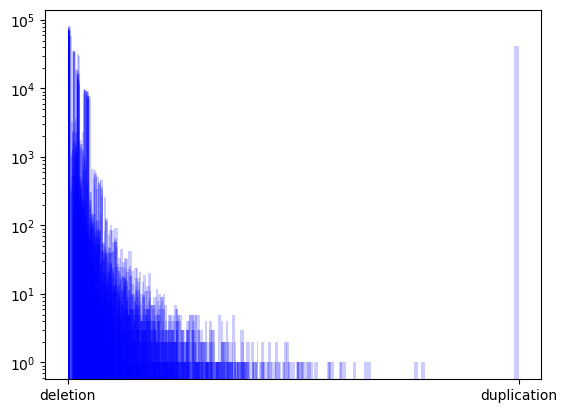

In [12]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,3:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True, color="blue")

In [13]:
chr8 = vst_dt[vst_dt['chr'] == '8']
chr8[chr8['start'] > 22700000].sort_values(by='start', ascending=True).head(50)

,chr,start,end,type,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
82673,8,22991201,22996700,duplication,0.0,0.02273,0.0,0.05061,0.0,0.0,...,0.02273,0.03694,0.02273,0.02273,0.04801,0.0,0.0,0.04742,0.04949,0.0
82674,8,22991201,23003900,duplication,0.0,0.00000,0.0,0.04167,0.0,0.0,...,0.00000,0.04167,0.00000,0.00000,0.04167,0.0,0.0,0.04167,0.04167,0.0
82675,8,22991401,22996700,duplication,0.0,0.02273,0.0,0.05184,0.0,0.0,...,0.02273,0.01723,0.02273,0.02273,0.04889,0.0,0.0,0.04821,0.05056,0.0
82676,8,22991401,23004500,duplication,0.0,0.02273,0.0,0.00000,0.0,0.0,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.0,0.0,0.00000,0.00000,0.0
82677,8,22991901,22996700,duplication,0.0,0.02273,0.0,0.04167,0.0,0.0,...,0.02273,0.01683,0.02273,0.02273,0.04167,0.0,0.0,0.04167,0.04167,0.0
82678,8,22992201,22996700,duplication,0.0,0.00000,0.0,0.07372,0.0,0.0,...,0.00000,0.06939,0.00000,0.00000,0.06458,0.0,0.0,0.06246,0.06980,0.0
82679,8,22992201,23004200,duplication,0.0,0.00000,0.0,0.04167,0.0,0.0,...,0.00000,0.04167,0.00000,0.00000,0.04167,0.0,0.0,0.04167,0.04167,0.0
82680,8,22992201,23004500,duplication,0.0,0.02273,0.0,0.00000,0.0,0.0,...,0.02273,0.02273,0.02273,0.02273,0.00000,0.0,0.0,0.00000,0.00000,0.0
82681,8,22992301,22996600,duplication,0.0,0.00000,0.0,0.04167,0.0,0.0,...,0.00000,0.04167,0.00000,0.00000,0.04167,0.0,0.0,0.04167,0.04167,0.0
82682,8,22992301,23003900,duplication,0.0,0.00000,0.0,0.04167,0.0,0.0,...,0.00000,0.04167,0.00000,0.00000,0.04167,0.0,0.0,0.04167,0.04167,0.0


In [14]:
vst_dt_filtering_location = vst_dt.iloc[filtering_vst.columns]
vst_dt_filtering_location[vst_dt_filtering_location['chr'] == '8'].sort_values(by='WestEurasia-Oceania', ascending=False).head(50)

,chr,start,end,type,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
82925,8,37935101,37938300,deletion,0.09591,0.00000,0.00000,0.20553,0.00000,0.02174,...,0.00000,0.18616,0.00000,0.02174,0.16376,0.00000,0.02174,0.15355,0.15160,0.02174
83808,8,120154601,120161200,deletion,0.00915,0.04097,0.02977,0.20473,0.04425,0.02114,...,0.10220,0.10119,0.12214,0.09288,0.31400,0.03704,0.01733,0.33615,0.30459,0.03645
83625,8,112294101,112297100,deletion,0.08001,0.04708,0.11264,0.19142,0.03554,0.13311,...,0.04794,0.13959,0.01533,0.04539,0.09376,0.06675,0.01384,0.21092,0.07141,0.05414
82246,8,11245601,11247200,deletion,0.04438,0.05960,0.07934,0.18586,0.17588,0.20997,...,0.25464,0.43047,0.41693,0.44680,0.08923,0.08623,0.05594,0.02177,0.02092,0.02043
82135,8,4122901,4125000,deletion,0.00987,0.26420,0.01323,0.18015,0.16188,0.01914,...,0.35865,0.01897,0.02264,0.22360,0.31500,0.29569,0.04308,0.02227,0.16115,0.14421
84190,8,146301401,146364100,deletion,0.05015,0.04964,0.07623,0.15280,0.41307,0.09463,...,0.01918,0.05789,0.28510,0.01972,0.04055,0.27633,0.01405,0.17771,0.02857,0.21008
82229,8,9497801,9501000,deletion,0.07399,0.11836,0.01443,0.11140,0.21003,0.03761,...,0.07150,0.01482,0.03263,0.03746,0.08426,0.17129,0.02224,0.04511,0.03684,0.09811
82960,8,39232101,39387200,deletion,0.01143,0.08750,0.02014,0.07264,0.01052,0.13688,...,0.05689,0.01524,0.12285,0.02804,0.06570,0.03727,0.11860,0.13101,0.02443,0.20424
83982,8,129762501,129766000,deletion,0.00950,0.01719,0.04262,0.05132,0.07562,0.08596,...,0.09191,0.03877,0.14469,0.13934,0.17292,0.02765,0.01994,0.24731,0.19688,0.01474
83500,8,96875201,96879600,deletion,0.00886,0.14705,0.01943,0.03459,0.03327,0.02921,...,0.17883,0.20409,0.19586,0.23358,0.03704,0.03704,0.01576,0.00000,0.02174,0.02174


In [67]:
#### SAVING VST FILE
vst_dt.to_csv('../data/vst_results_cnvnator.csv')
vst_dt['chr'] = vst_dt['chr'].astype(int)
vst_dt = vst_dt.sort_values(by='chr')
vst_dt

,chr,start,end,type,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,...,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia,i
0,1,176101,230900,deletion,0.00000,0.00000,0.00000,0.00000,0.00000,0.02174,...,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174,0.0
1,1,176201,230100,deletion,0.01351,0.01351,0.01351,0.01351,0.01351,0.01351,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.0
2,1,176901,230500,deletion,0.00000,0.00000,0.00000,0.00000,0.04545,0.00000,...,0.00000,0.04545,0.00000,0.00000,0.04545,0.00000,0.04545,0.00000,0.04545,2.0
3,1,177001,230500,deletion,0.00000,0.00000,0.00000,0.00000,0.00000,0.02174,...,0.00000,0.00000,0.02174,0.00000,0.00000,0.02174,0.00000,0.02174,0.02174,3.0
4,1,177101,230500,deletion,0.01351,0.01351,0.01351,0.01750,0.01351,0.01351,...,0.04167,0.00000,0.00000,0.04167,0.00000,0.00000,0.04167,0.04167,0.00000,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58937,22,21582301,21597000,duplication,0.00000,0.00000,0.03704,0.00000,0.00000,0.00000,...,0.00000,0.00000,0.00000,0.03704,0.03704,0.03704,0.00000,0.00000,0.00000,58937.0
58936,22,21582301,21596500,duplication,0.00000,0.02273,0.00000,0.00000,0.00000,0.00000,...,0.02273,0.02273,0.02273,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,58936.0
58935,22,21582301,21594700,duplication,0.01012,0.02326,0.01894,0.01110,0.04169,0.00974,...,0.02273,0.01934,0.02273,0.03704,0.03553,0.03704,0.04545,0.00000,0.04545,58935.0
59148,22,21604501,21608500,duplication,0.01826,0.01864,0.01008,0.01689,0.02105,0.00921,...,0.00000,0.04545,0.02174,0.03704,0.03289,0.01509,0.04545,0.02174,0.01927,59148.0


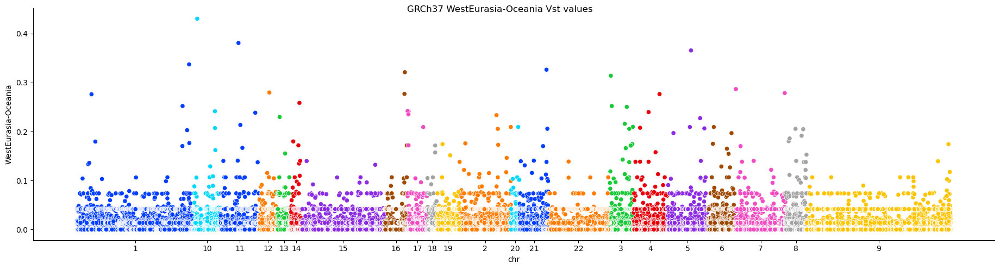

In [68]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='WestEurasia-Oceania', aspect=3.7, 
                  hue='chr', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('chr')['i'].median()
plot.ax.set_xlabel('chr'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('GRCh37 WestEurasia-Oceania Vst values');

<h1> Computing permutation for each pair-group whole samples

In [ ]:
from stattools.resampling import PermutationTest
PermutationTest

In [ ]:
pt = PermutationTest(dt_group.get_group(str('WestEurasia'))[176], dt_group.get_group(str('America'))[176], stat=vst, n_perm=999)

In [ ]:
p_value_ = pt.p_value()
print(f"p-value: {p_value_:.4f}")

<h1> Deletions PCA

In [44]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts


,637,765,1154,1173,1292,1402,1632,1666,1746,1868,...,100141,100378,100415,100561,100637,100696,100727,100742,100783,100833
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,0.512572,2.000000,2.000000,0.509294,2.000000,2.0,2.000000,0.000000,2.00000,0.000982
LP6005441-DNA_A03,2.000000,2.0,0.468723,0.012805,0.022213,2.000000,2.000000,0.503000,0.002383,2.000000,...,2.000000,2.000000,0.442444,2.000000,2.000000,2.0,2.000000,0.460457,2.00000,0.526143
LP6005441-DNA_A04,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,0.469635,2.000000,0.001388,2.000000,...,2.000000,0.505127,2.000000,0.546489,0.005694,2.0,0.000000,0.000000,2.00000,2.000000
LP6005441-DNA_A05,2.000000,2.0,0.471221,0.006072,2.000000,0.515259,2.000000,2.000000,0.493222,0.474593,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,2.000000,2.000000,2.00000,0.000000
LP6005441-DNA_A06,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.477038,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,0.518588,0.000000,2.00000,0.553456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.000000,2.0,2.000000,0.497922,2.000000,2.000000,2.000000,2.000000,0.001773,2.000000,...,2.000000,0.506512,2.000000,0.013988,0.009683,2.0,0.000000,0.000000,0.58923,0.005321
SS6004477,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,0.017509,0.001223,2.000000,...,2.000000,2.000000,0.510076,2.000000,2.000000,2.0,2.000000,0.000000,2.00000,2.000000
SS6004478,2.000000,2.0,0.441612,0.002539,2.000000,2.000000,2.000000,2.000000,0.487295,2.000000,...,2.000000,0.006271,2.000000,2.000000,2.000000,2.0,2.000000,0.000000,2.00000,2.000000


In [45]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]

counts = counts.fillna(2)


counts = counts.sort_index()
counts

,637,765,1154,1173,1292,1402,1632,1666,1746,1868,...,100141,100378,100415,100561,100637,100696,100727,100742,100783,100833
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,0.512572,2.000000,2.000000,0.509294,2.000000,2.0,2.000000,0.000000,2.00000,0.000982
LP6005441-DNA_A03,2.000000,2.0,0.468723,0.012805,0.022213,2.000000,2.000000,0.503000,0.002383,2.000000,...,2.000000,2.000000,0.442444,2.000000,2.000000,2.0,2.000000,0.460457,2.00000,0.526143
LP6005441-DNA_A04,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,0.469635,2.000000,0.001388,2.000000,...,2.000000,0.505127,2.000000,0.546489,0.005694,2.0,0.000000,0.000000,2.00000,2.000000
LP6005441-DNA_A05,2.000000,2.0,0.471221,0.006072,2.000000,0.515259,2.000000,2.000000,0.493222,0.474593,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,2.000000,2.000000,2.00000,0.000000
LP6005441-DNA_A06,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.477038,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,0.518588,0.000000,2.00000,0.553456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.000000,2.0,2.000000,0.497922,2.000000,2.000000,2.000000,2.000000,0.001773,2.000000,...,2.000000,0.506512,2.000000,0.013988,0.009683,2.0,0.000000,0.000000,0.58923,0.005321
SS6004477,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,0.017509,0.001223,2.000000,...,2.000000,2.000000,0.510076,2.000000,2.000000,2.0,2.000000,0.000000,2.00000,2.000000
SS6004478,2.000000,2.0,0.441612,0.002539,2.000000,2.000000,2.000000,2.000000,0.487295,2.000000,...,2.000000,0.006271,2.000000,2.000000,2.000000,2.0,2.000000,0.000000,2.00000,2.000000


In [46]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [47]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus),-0.170183,-2.518884,-2.834831,0.197329,-0.156788,-0.896961,-0.339846,-1.769117,-0.012493,1.446373
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-1.672370,4.782363,-0.213083,0.180784,0.374421,-2.257142,1.747066,1.823537,-0.583976,0.148945
LP6005441-DNA_A04,F,America,Colombia,-4.263202,-2.415182,4.972177,2.571723,0.607345,-1.410885,1.487174,0.953716,-1.728479,0.173239
LP6005441-DNA_A05,M,WestEurasia,France,1.136237,-1.486029,-2.713474,-0.289044,-0.090768,1.361775,-0.624822,0.208991,1.409914,0.281671
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),-0.383781,-2.212037,-2.443182,0.620318,-0.334592,-1.232095,1.272387,-1.434838,-0.414619,0.240531
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-1.754844,-2.909035,3.666320,4.187624,-1.483792,-1.159440,0.237089,0.581229,0.192139,0.784254
SS6004477,M,Oceania,Australia,0.471181,6.394634,-0.700890,3.451347,0.637968,0.621428,-1.601174,2.026511,0.095626,-0.543708
SS6004478,U,Oceania,Australia,1.028262,4.532715,-0.951516,1.413364,-0.445788,-0.874982,0.985078,-0.210528,1.000860,0.214145
SS6004479,F,America,Mexico,-2.335379,-1.687279,2.661662,2.886603,-2.851448,-2.433659,-0.562202,0.777584,1.305968,-2.051621


In [48]:
pca.explained_variance_ratio_

array([0.06539604, 0.03721561, 0.03372589, 0.02453368, 0.01473613,
       0.01414786, 0.01354251, 0.01338274, 0.01317538, 0.01286867])

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.170183    -2.518884    -2.834831   
Oceania            F    PapuaNewGuinea    -1.672370     4.782363    -0.213083   
America            F          Colombia    -4.263202    -2.415182     4.972177   
WestEurasia        M            France     1.136237    -1.486029    -2.713474   
WestEurasia        M    Italy(Bergamo)    -0.383781    -2.212037    -2.443182   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.754844    -2.909035     3.666320   
Oceania            M         Australia     0.471181     6.394634    -0.700890   
Oceania            U         Australia     1.028262     4.532715    -0.951516   
America            F            Mexico    -2.335379    -1.687279     2.661662   
Africa             M        

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.170183    -2.518884    -2.834831   
Oceania            F    PapuaNewGuinea    -1.672370     4.782363    -0.213083   
America            F          Colombia    -4.263202    -2.415182     4.972177   
WestEurasia        M            France     1.136237    -1.486029    -2.713474   
WestEurasia        M    Italy(Bergamo)    -0.383781    -2.212037    -2.443182   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.754844    -2.909035     3.666320   
Oceania            M         Australia     0.471181     6.394634    -0.700890   
Oceania            U         Australia     1.028262     4.532715    -0.951516   
America            F            Mexico    -2.335379    -1.687279     2.661662   
Africa             M        

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


Count of groups by factor: 7
            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.170183    -2.518884    -2.834831   
Oceania            F    PapuaNewGuinea    -1.672370     4.782363    -0.213083   
America            F          Colombia    -4.263202    -2.415182     4.972177   
WestEurasia        M            France     1.136237    -1.486029    -2.713474   
WestEurasia        M    Italy(Bergamo)    -0.383781    -2.212037    -2.443182   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.754844    -2.909035     3.666320   
Oceania            M         Australia     0.471181     6.394634    -0.700890   
Oceania            U         Australia     1.028262     4.532715    -0.951516   
America            F            Mexico    -2.335379    -1.687279     2.661662   

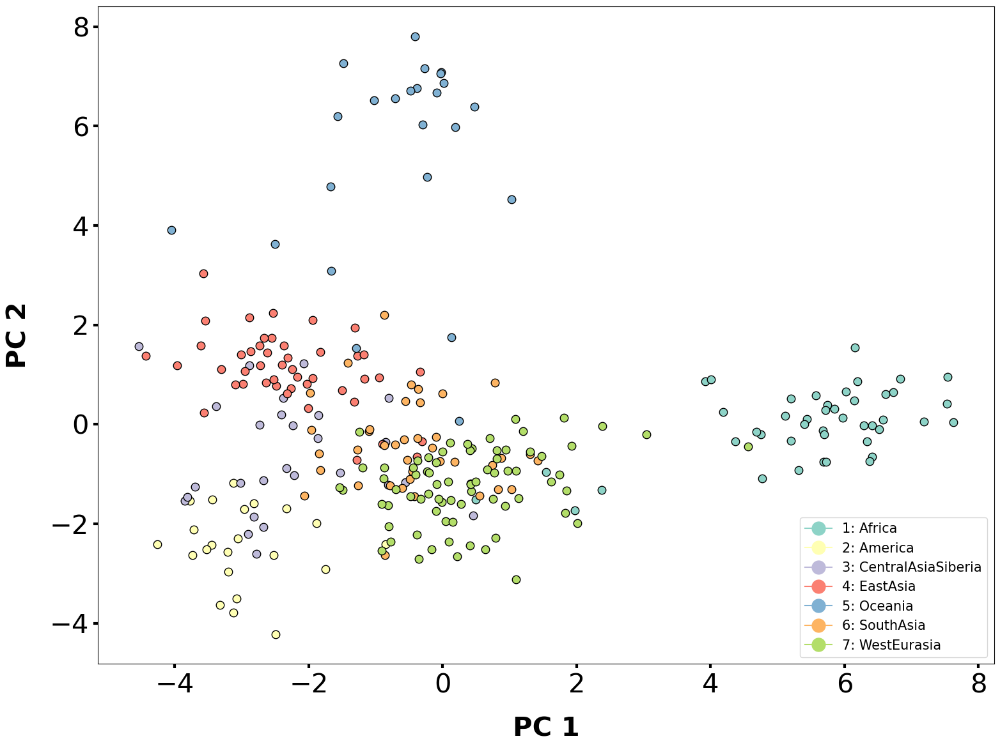

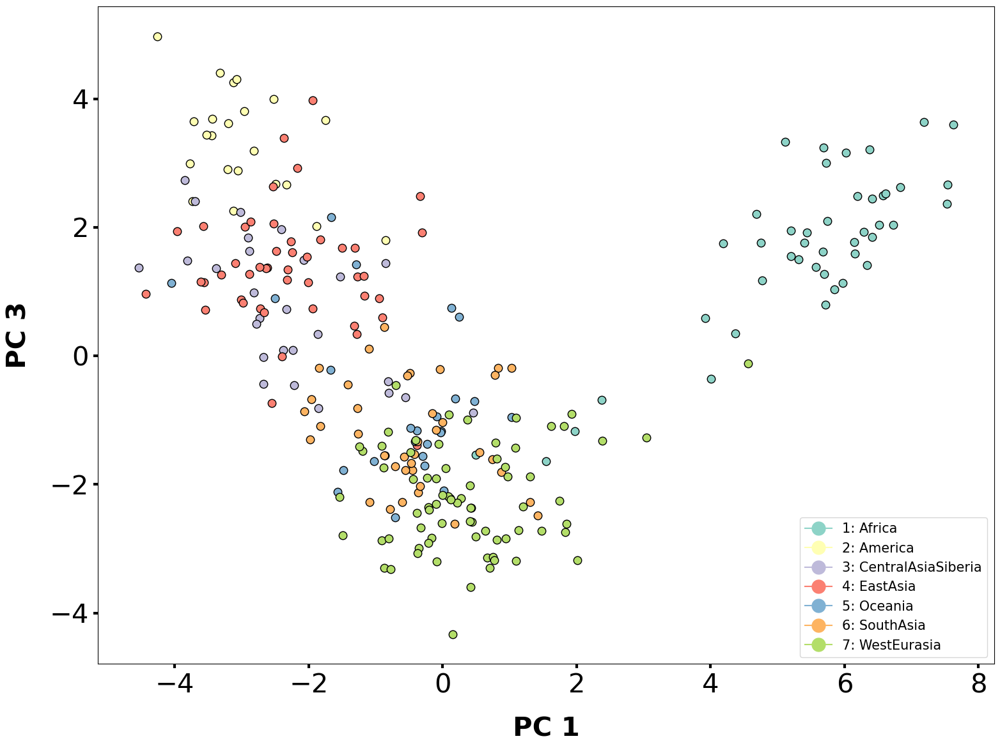

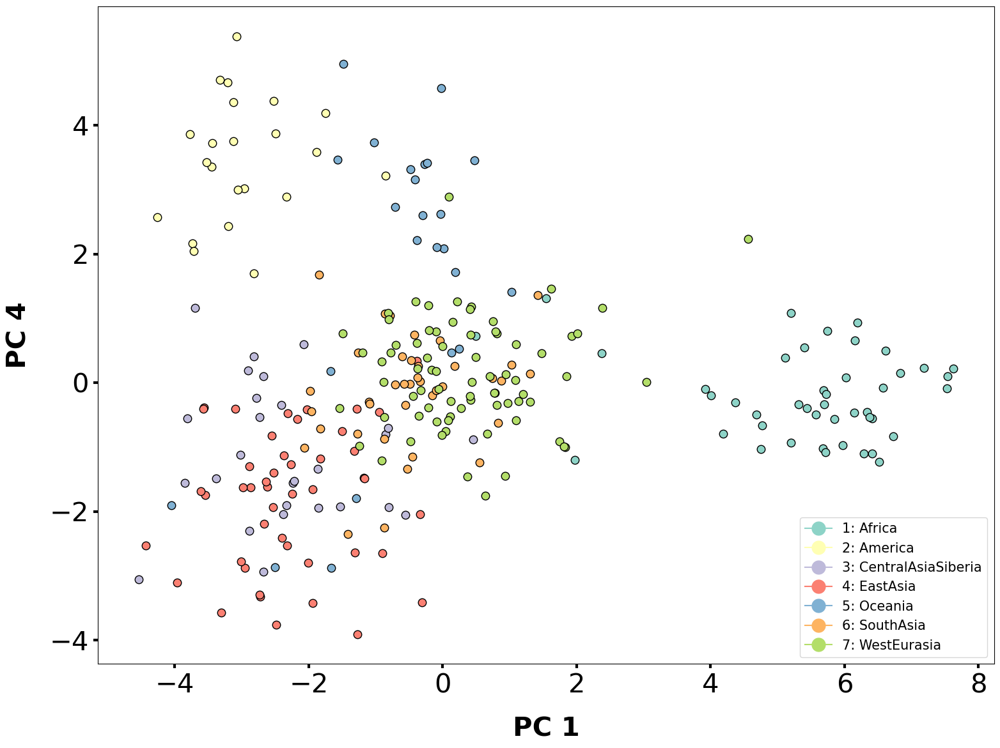

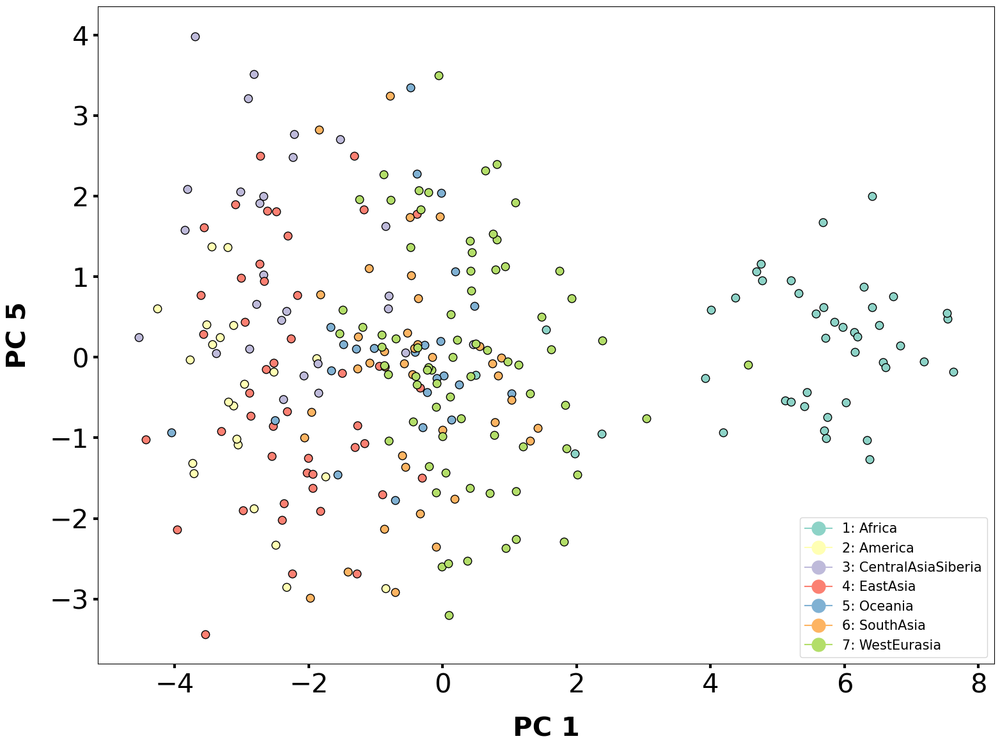

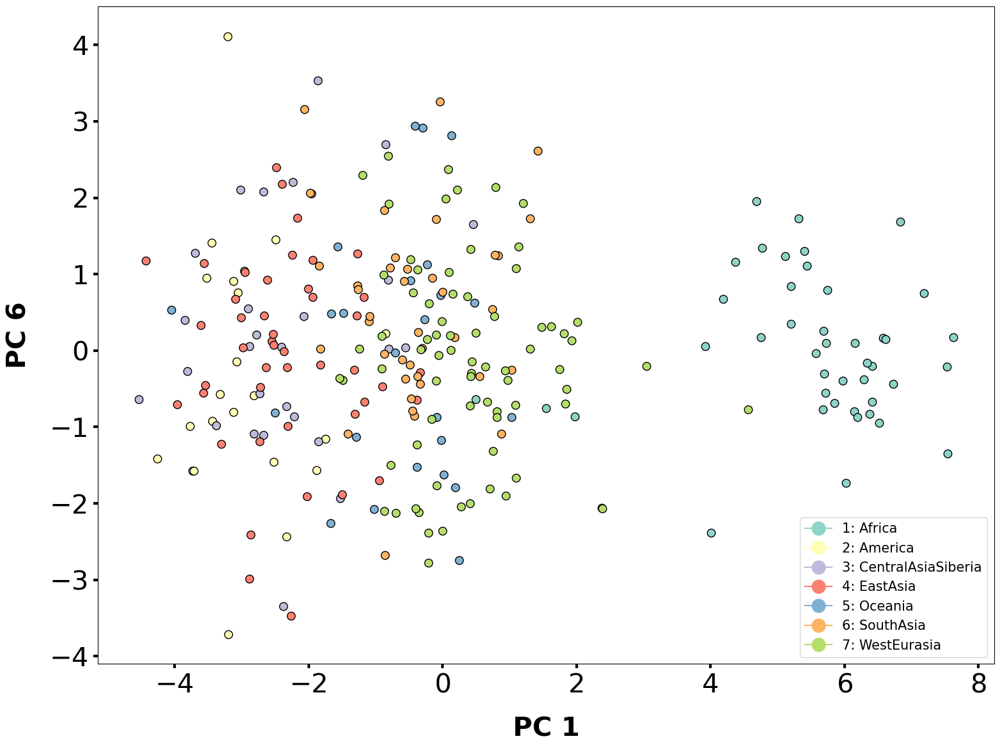

...

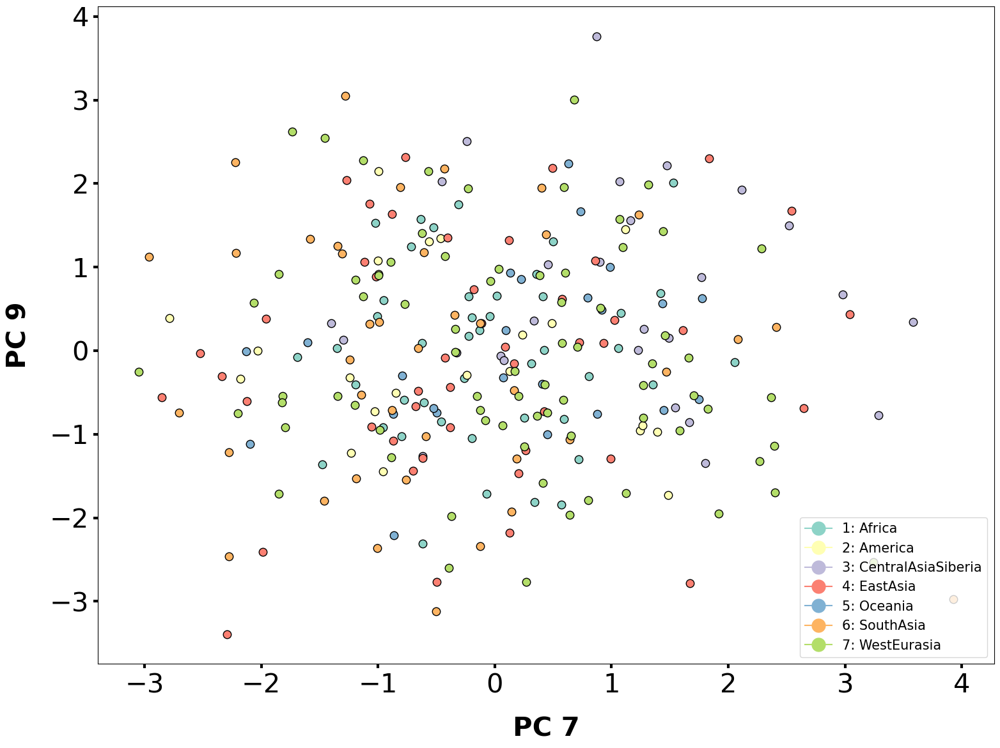

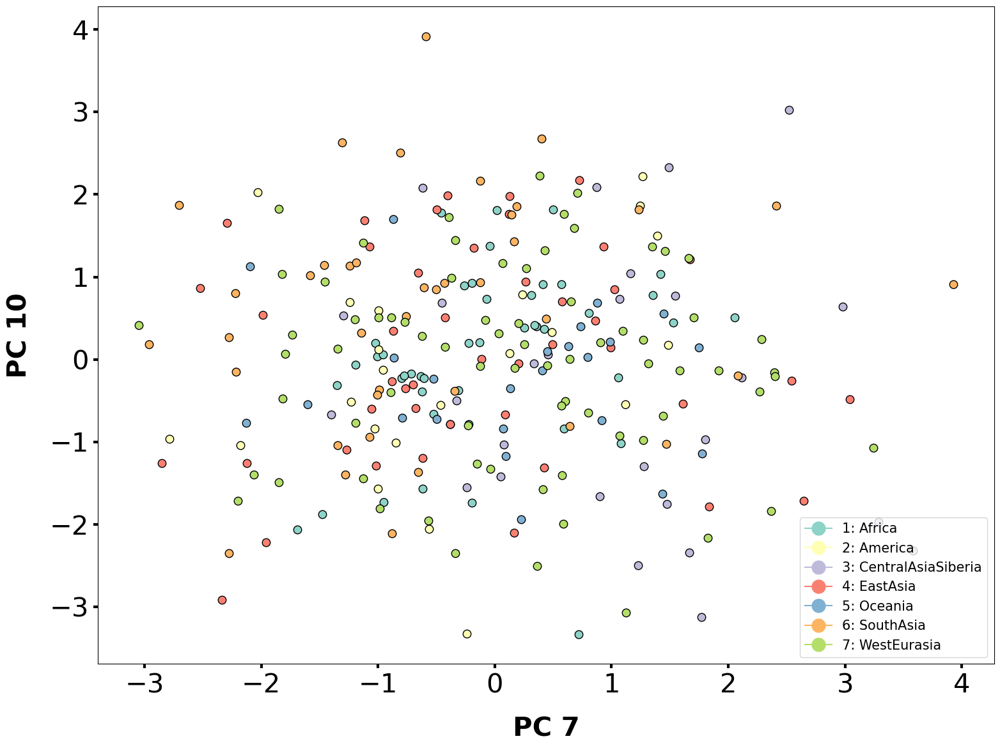

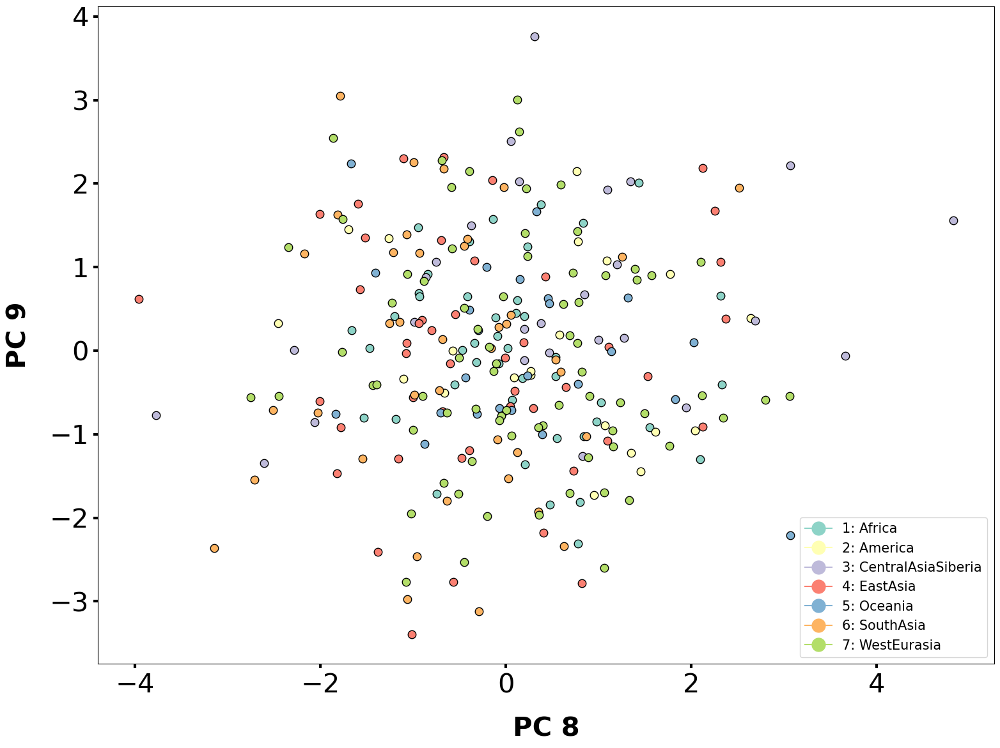

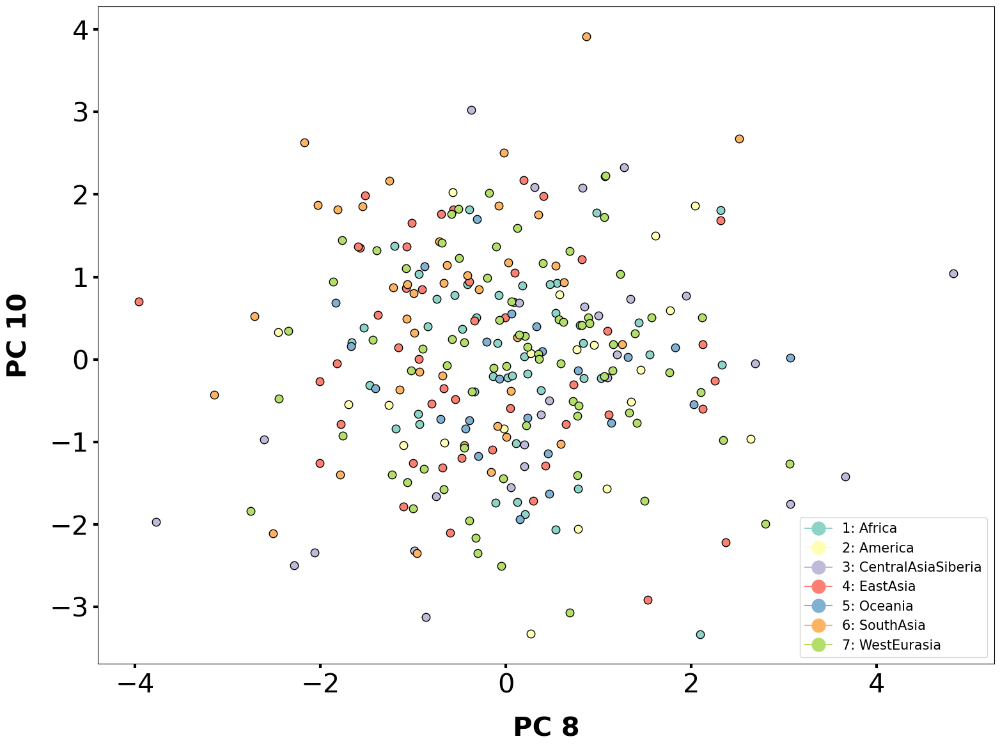

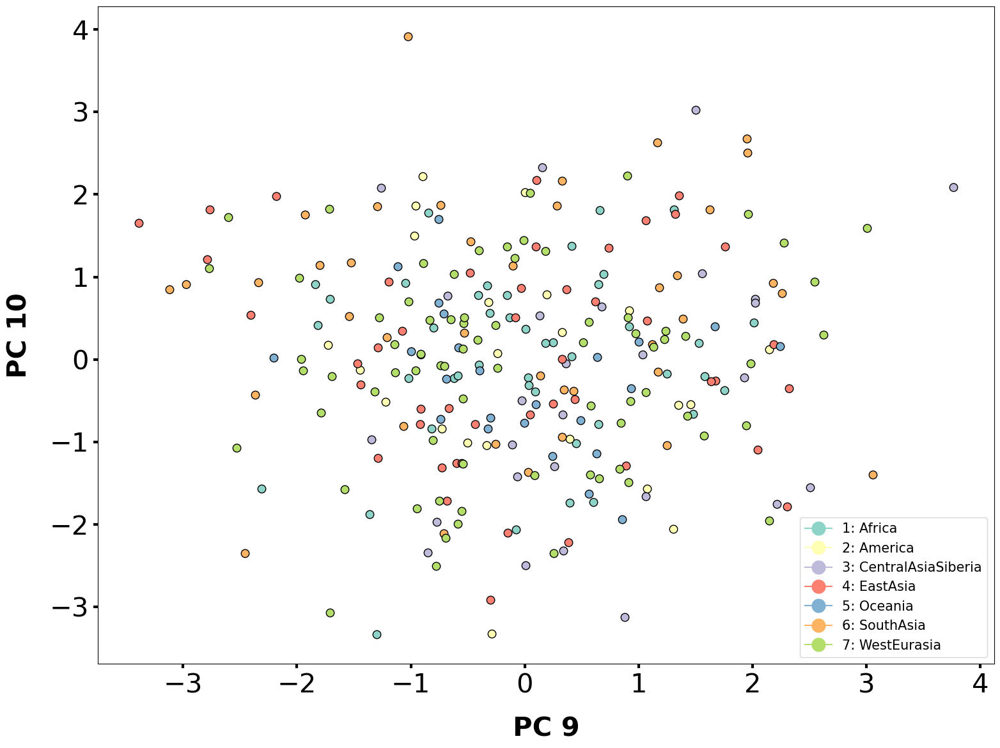

In [49]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.170183    -2.518884    -2.834831   
Oceania            F    PapuaNewGuinea    -1.672370     4.782363    -0.213083   
America            F          Colombia    -4.263202    -2.415182     4.972177   
WestEurasia        M            France     1.136237    -1.486029    -2.713474   
WestEurasia        M    Italy(Bergamo)    -0.383781    -2.212037    -2.443182   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.754844    -2.909035     3.666320   
Oceania            M         Australia     0.471181     6.394634    -0.700890   
Oceania            U         Australia     1.028262     4.532715    -0.951516   
America            F            Mexico    -2.335379    -1.687279     2.661662   
Africa             M        

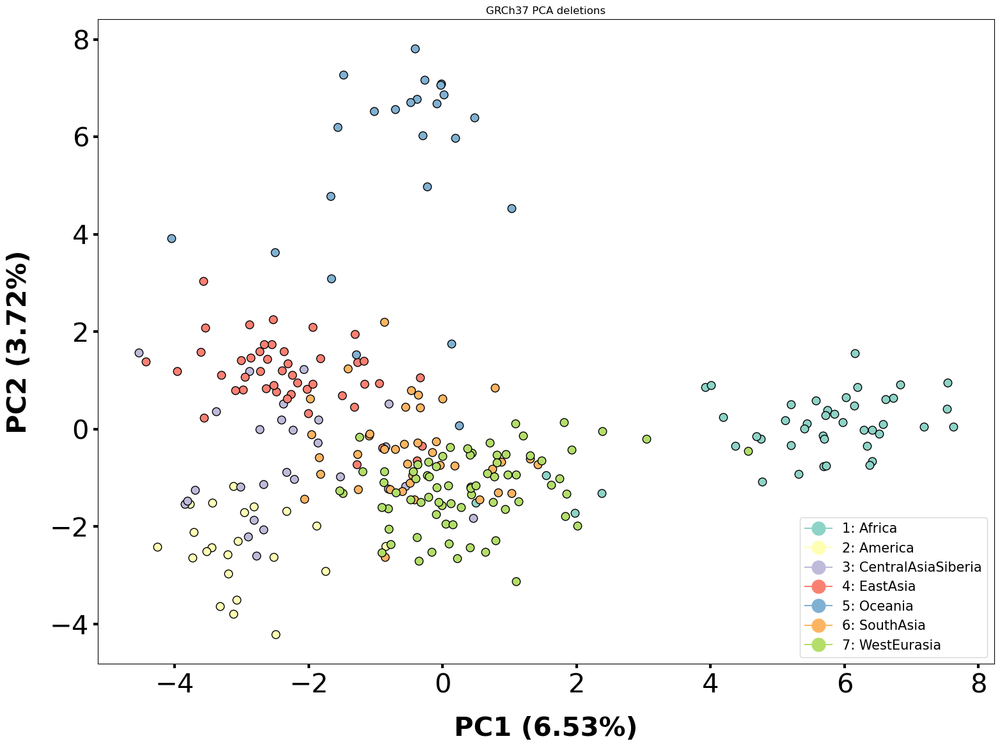

In [50]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (6.53%)', label_vertical='PC2 (3.72%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc12.png', transparent=True)

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.170183    -2.518884    -2.834831   
Oceania            F    PapuaNewGuinea    -1.672370     4.782363    -0.213083   
America            F          Colombia    -4.263202    -2.415182     4.972177   
WestEurasia        M            France     1.136237    -1.486029    -2.713474   
WestEurasia        M    Italy(Bergamo)    -0.383781    -2.212037    -2.443182   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -1.754844    -2.909035     3.666320   
Oceania            M         Australia     0.471181     6.394634    -0.700890   
Oceania            U         Australia     1.028262     4.532715    -0.951516   
America            F            Mexico    -2.335379    -1.687279     2.661662   
Africa             M        

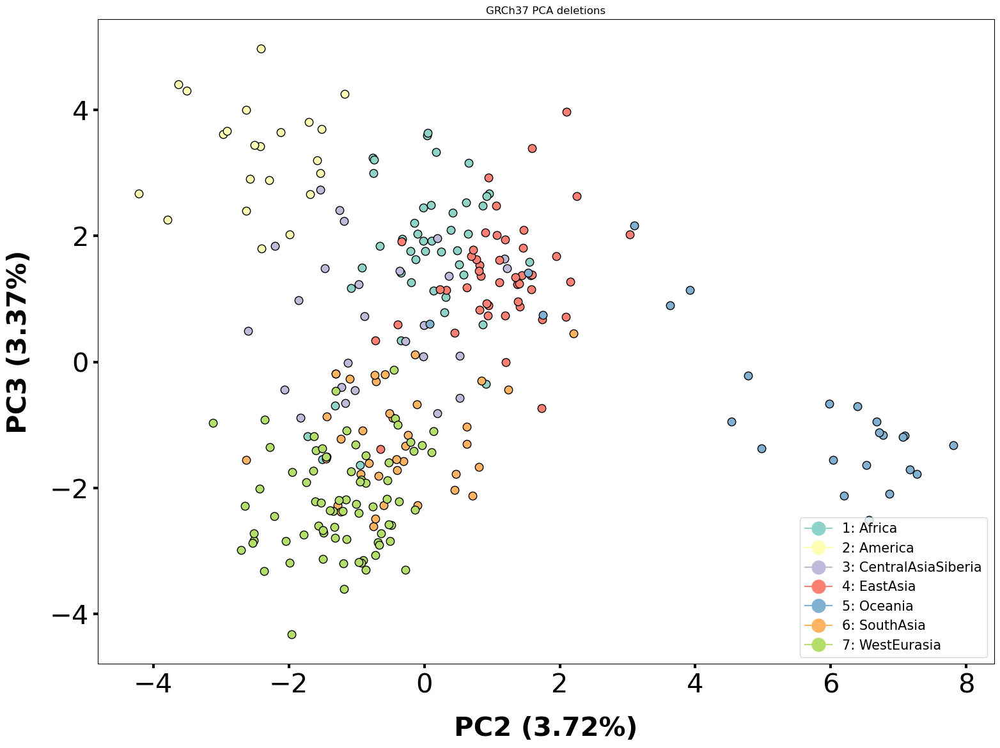

In [51]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (3.72%)', label_vertical='PC3 (3.37%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc23.png', transparent=True)

<h1> Duplications

In [35]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts = counts.fillna(2)
counts = counts.sort_index()
counts


,1905,5731,7805,9241,22845,45956,75649,75718,96641
Sample_ID,,,,,,,,,
LP6005441-DNA_A01,2.03161,2.00000,2.00000,2.00000,2.00000,2.00000,3.51592,3.95014,3.16836
LP6005441-DNA_A03,2.00000,2.00000,2.00000,2.00000,1.86559,2.62296,2.00000,2.00000,2.00000
LP6005441-DNA_A04,2.07336,2.00000,1.74532,1.80694,2.00000,2.44049,2.00000,2.00000,2.00000
LP6005441-DNA_A05,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000,3.35112
LP6005441-DNA_A06,2.00000,2.85801,2.00000,1.80195,1.95492,2.41274,3.22222,3.68628,2.00000
...,...,...,...,...,...,...,...,...,...
SS6004476,2.00000,2.00000,2.00000,2.00000,2.00000,2.65178,2.00000,2.00000,2.00000
SS6004477,1.98171,2.00000,2.00000,2.00000,2.00000,2.35459,2.00000,2.00000,2.00000
SS6004478,2.04448,2.00000,2.00000,2.00000,2.00000,2.00000,2.00000,4.31492,2.00000


In [36]:
features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [38]:
#PCA
pca = PCA(n_components=5)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus),1.855529,0.894651,-0.605650,-0.228260,-0.251560
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-0.432668,-0.494165,-0.033306,-0.346192,0.344795
LP6005441-DNA_A04,F,America,Colombia,-0.426609,-0.495503,-0.019657,-0.309073,0.157250
LP6005441-DNA_A05,M,WestEurasia,France,-0.605409,0.812980,-0.361864,-0.326539,-0.262826
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),1.584904,-0.232302,-0.295288,0.608426,0.291836
...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-0.431710,-0.498490,-0.032909,-0.345367,0.360805
SS6004477,M,Oceania,Australia,-0.431305,-0.487379,-0.020150,-0.296546,0.070497
SS6004478,U,Oceania,Australia,1.247455,-0.671375,-1.577596,-0.078064,-0.326293
SS6004479,F,America,Mexico,-0.430080,-0.472653,-0.005231,-0.239659,-0.269656


            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

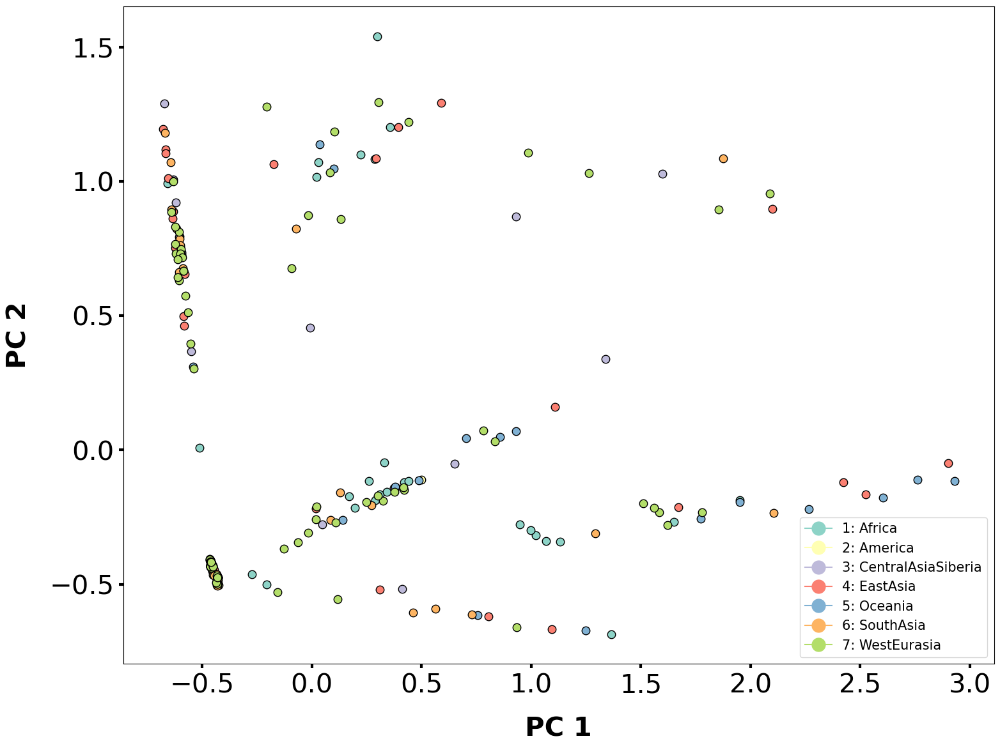

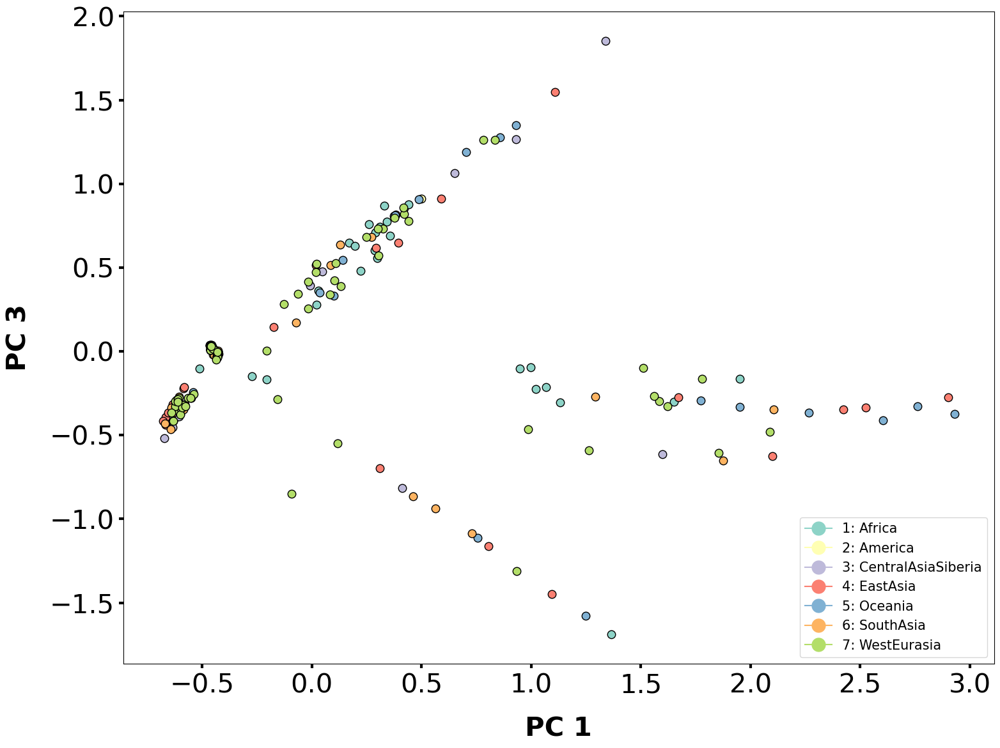

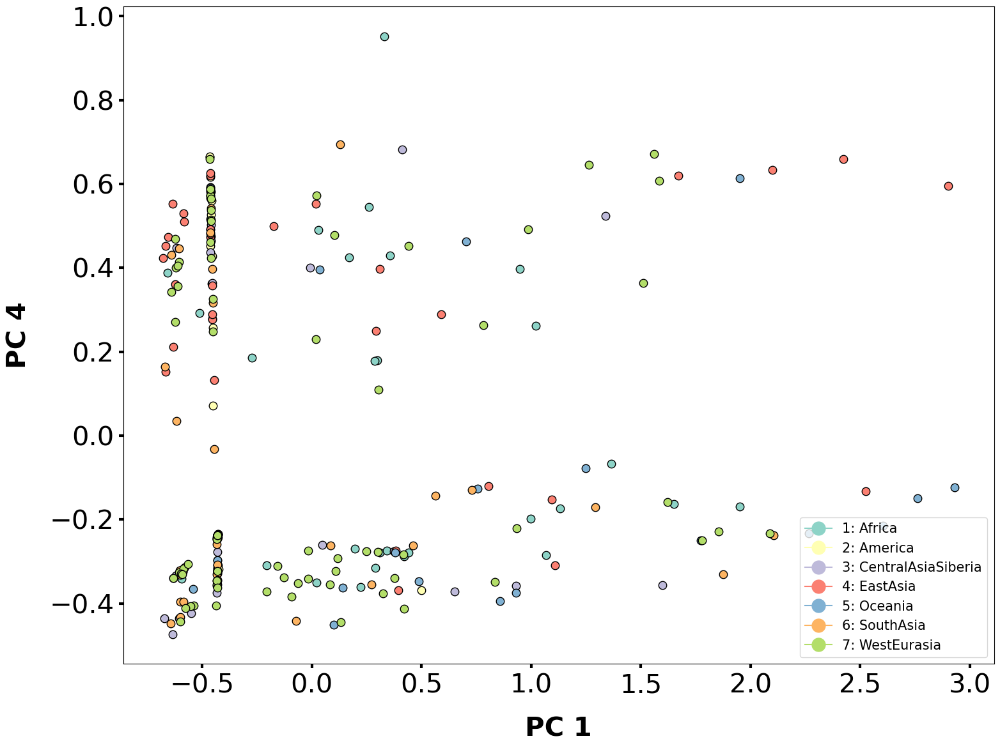

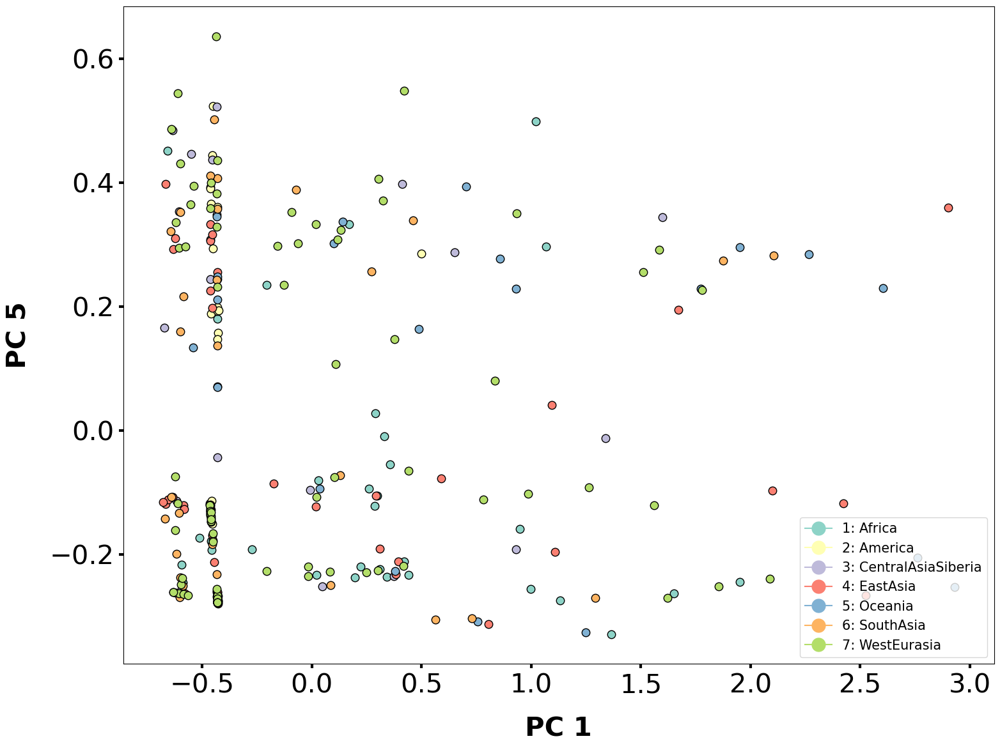

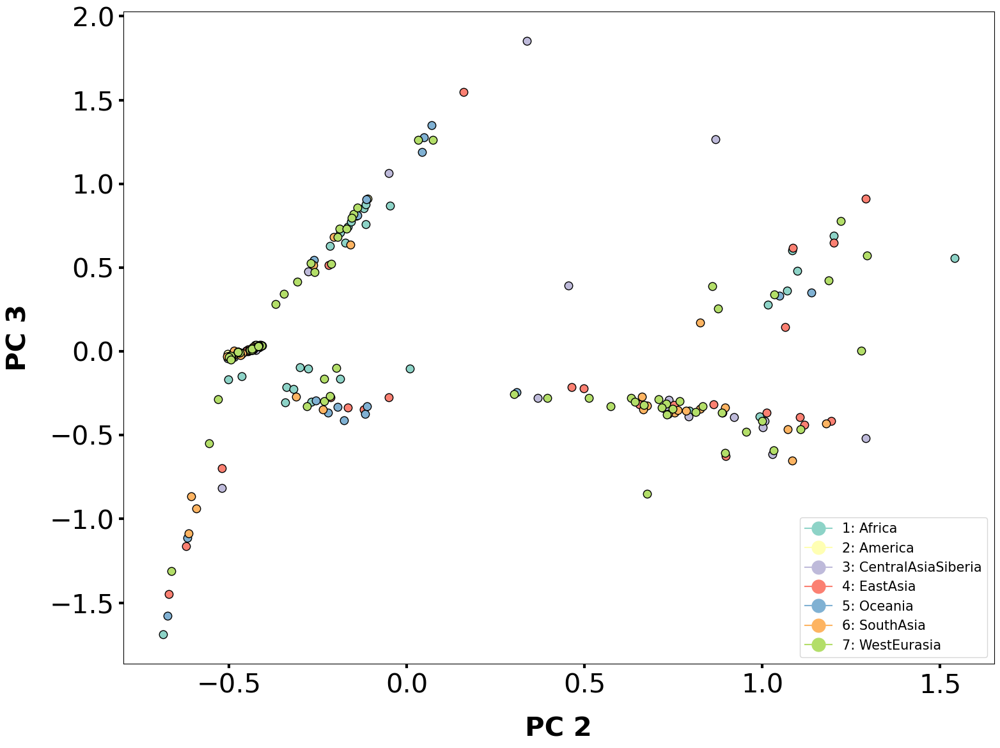

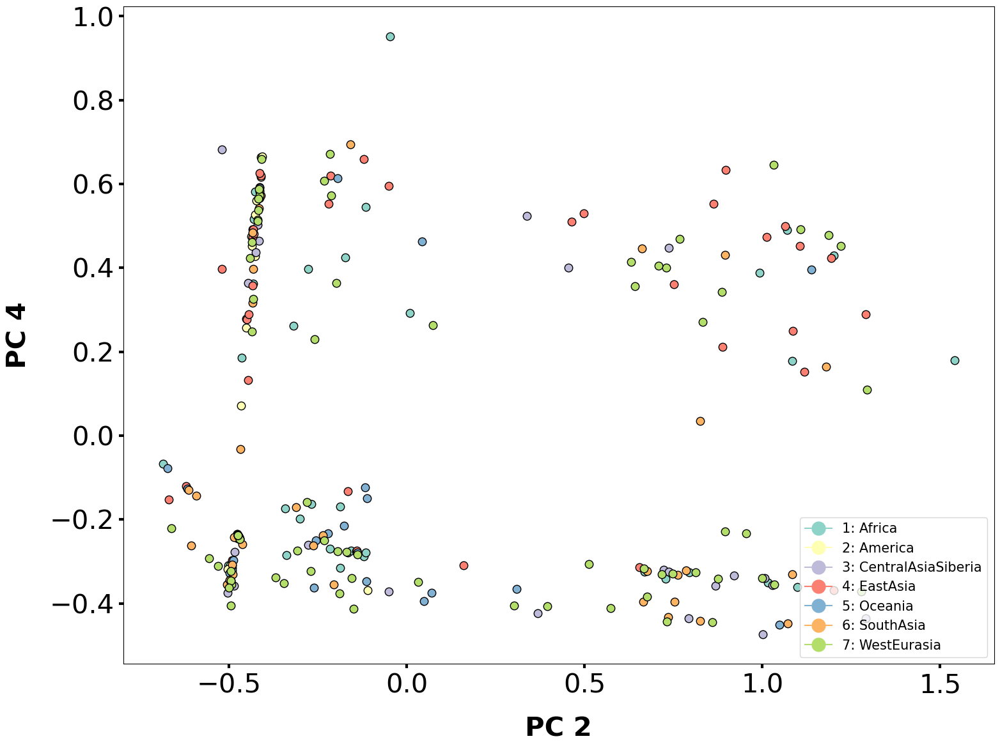

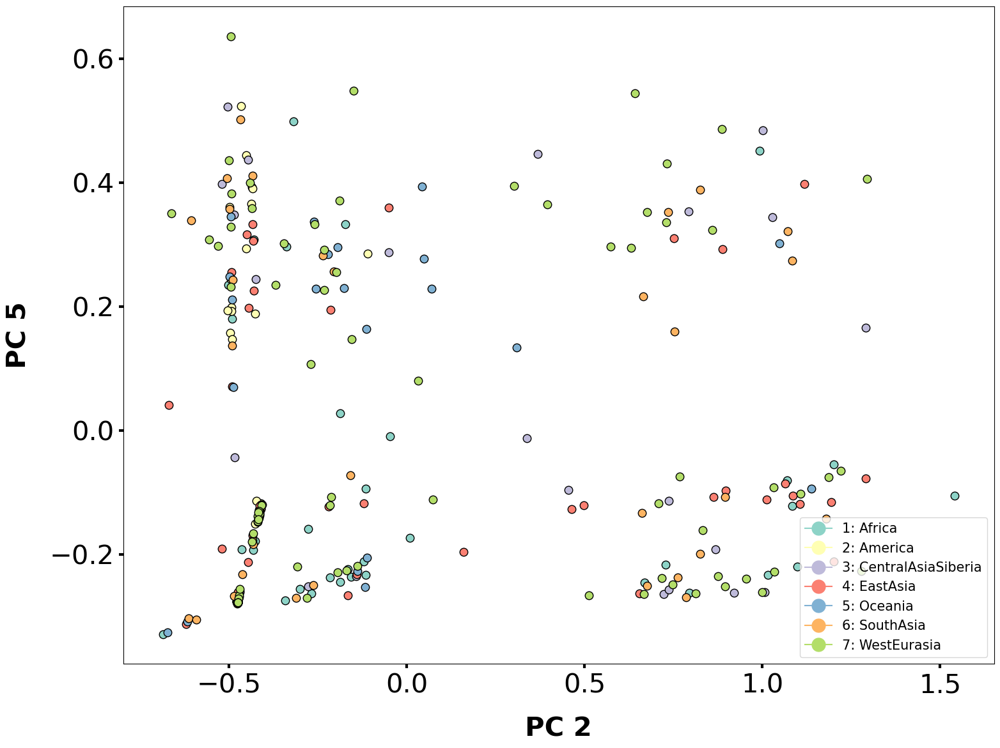

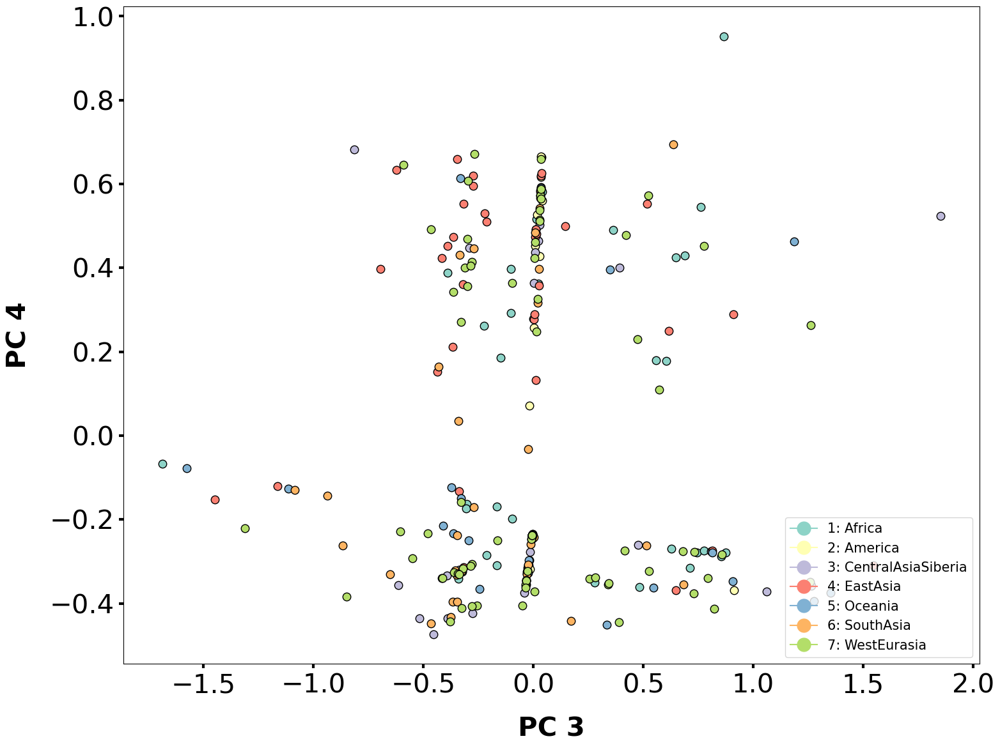

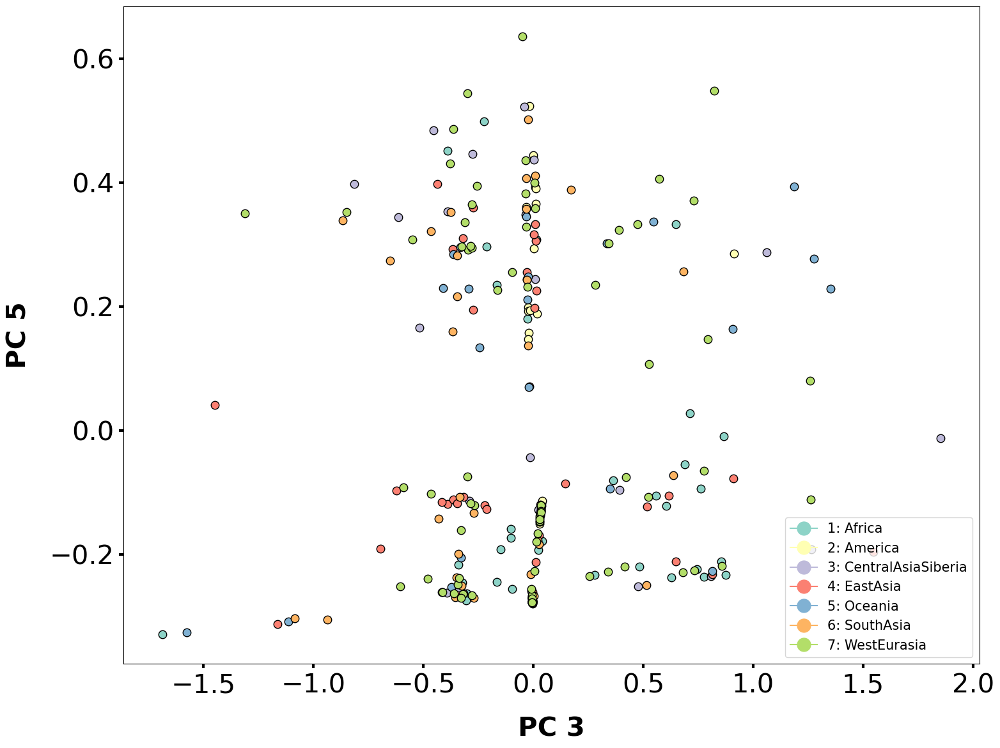

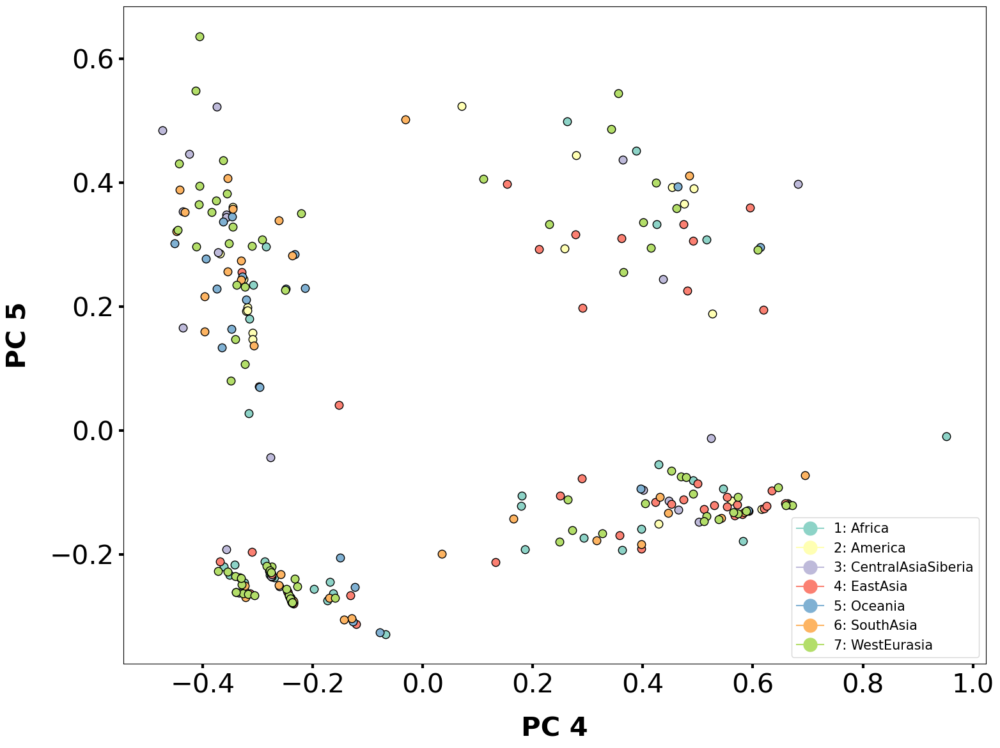

In [39]:
components = [1,2,3,4,5]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [40]:
pca.explained_variance_ratio_

array([0.42552687, 0.24613321, 0.15993992, 0.09841705, 0.04728886])

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

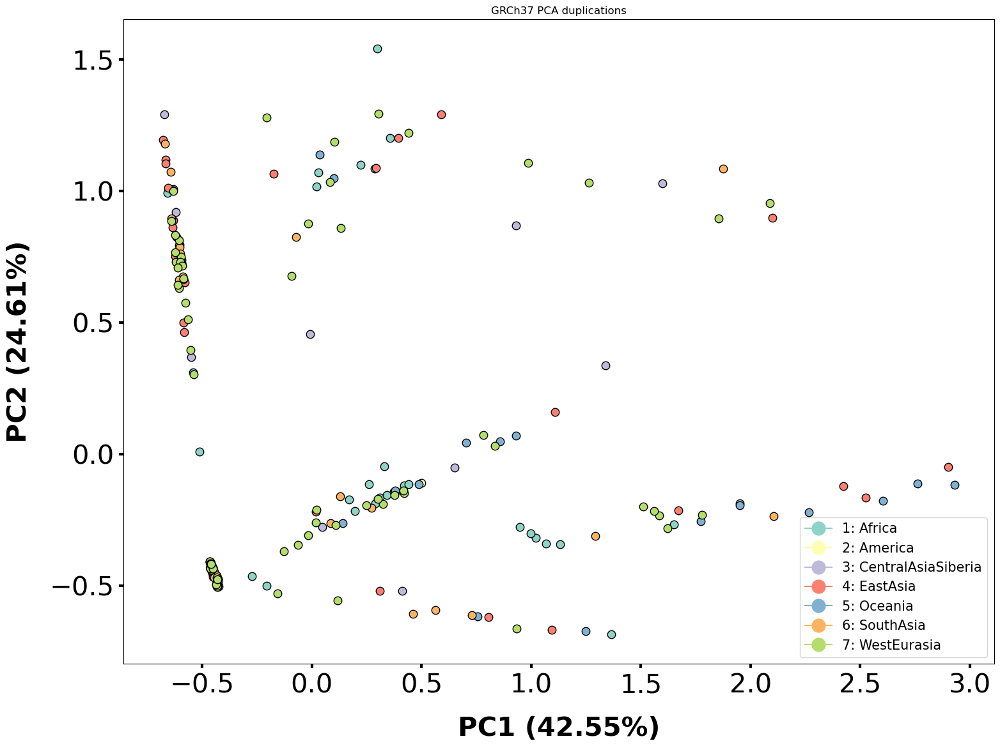

In [41]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (42.55%)', label_vertical='PC2 (24.61%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc12.png', transparent=True)

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)     1.855529     0.894651    -0.605650   
Oceania            F    PapuaNewGuinea    -0.432668    -0.494165    -0.033306   
America            F          Colombia    -0.426609    -0.495503    -0.019657   
WestEurasia        M            France    -0.605409     0.812980    -0.361864   
WestEurasia        M    Italy(Bergamo)     1.584904    -0.232302    -0.295288   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -0.431710    -0.498490    -0.032909   
Oceania            M         Australia    -0.431305    -0.487379    -0.020150   
Oceania            U         Australia     1.247455    -0.671375    -1.577596   
America            F            Mexico    -0.430080    -0.472653    -0.005231   
Africa             M        

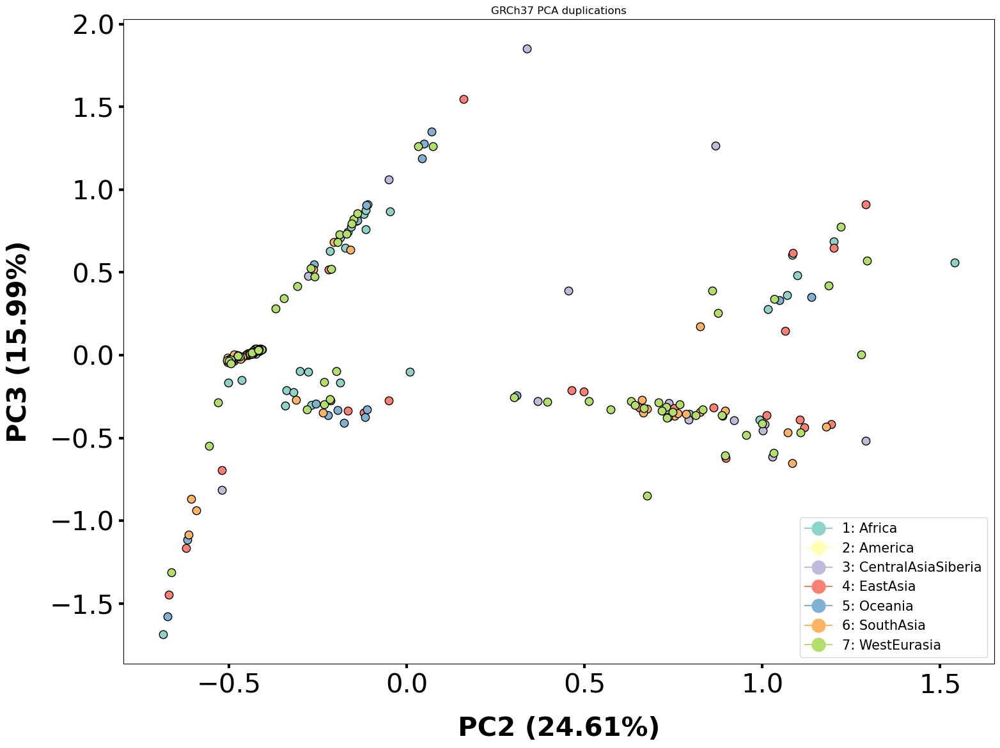

In [42]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (24.61%)', label_vertical='PC3 (15.99%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc23.png', transparent=True)

<h1> Dmean results 

In [ ]:
dmean_hg19 = pd.read_csv('dmean_hg19_results.csv')
dmean_hg19 = dmean_hg19.iloc[:,3:24]
dmean_hg19

In [ ]:
dmean_hg19_permutation = pd.read_csv('dmean_permutation_results.csv').set_index('Unnamed: 0')
dmean_hg19_permutation# = dmean_hg19_permutation.iloc[:,3:8655]

dmean_hg19_permutation.index.name = None
dmean_hg19_permutation

In [ ]:
filtering_dmean = pd.DataFrame(dmean_hg19.T)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


In [ ]:
dmean_boolean = (dmean_hg19_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 



In [ ]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [ ]:
passed_dmean_cnvs = pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1)
passed_dmean_cnvs

<h1> Overlapped CNVs that passed Vst and Dmean that also passed the permutation 

In [ ]:
vst_and_dmean_cnvs = pd.concat([filtering_vst.T, passed_dmean_cnvs],join='inner', axis=1)
vst_and_dmean_cnvs

In [ ]:
# DMEAN & VST RESULTS 
inner_vst = len(vst_and_dmean_cnvs)
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(filtering_vst.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Vst'))
plt.title('CNVs that overlap results from Vst and Dmean')
plt.show()

In [ ]:
input_liftover = candidates574.iloc[:,0:3]
input_liftover['chr'] = ('chr' + input_liftover['chr'])
input_liftover.to_csv('coordinates_574_candidates.bed', sep='\t', header=False, index=False)